In [2]:
!pip install pandas matplotlib seaborn networkx numpy plotly

  Obtaining dependency information for matplotlib from https://files.pythonhosted.org/packages/26/af/5ec3d4636106718bb62503a03297125d4514f98fe818461bd9e6b9d116e4/matplotlib-3.10.1-cp310-cp310-macosx_11_0_arm64.whl.metadata
  Using cached matplotlib-3.10.1-cp310-cp310-macosx_11_0_arm64.whl.metadata (11 kB)
  Obtaining dependency information for seaborn from https://files.pythonhosted.org/packages/83/11/00d3c3dfc25ad54e731d91449895a79e4bf2384dc3ac01809010ba88f6d5/seaborn-0.13.2-py3-none-any.whl.metadata
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
  Obtaining dependency information for networkx from https://files.pythonhosted.org/packages/b9/54/dd730b32ea14ea797530a4479b2ed46a6fb250f682a9cfb997e968bf0261/networkx-3.4.2-py3-none-any.whl.metadata
  Obtaining dependency information for plotly from https://files.pythonhosted.org/packages/02/65/ad2bc85f7377f5cfba5d4466d5474423a3fb7f6a97fd807c06f92dd3e721/plotly-6.0.1-py3-none-any.whl.metadata
  Using cached plotly-6.0.1-py

In [3]:
# NatWest Sitemap Analysis Notebook
# ===========================
# This notebook analyzes the structure and content of a website sitemap
# It provides various visualizations and insights about the site structure

# Cell 1: Import Libraries
# -----------------------
# Run this cell to import all necessary packages

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import numpy as np
from datetime import datetime
from urllib.parse import urlparse
import plotly.graph_objects as go
import plotly.express as px
from collections import defaultdict
import re

In [4]:
# Cell 2: Load and Examine Data
# ----------------------------
# Load the sitemap data from CSV and display basic information

# Load the data from the CSV file
df = pd.read_csv('natwest_sitemap.csv')

# Display basic information about the dataset
print(f"Total number of pages in the sitemap: {len(df)}")
print(f"Columns in the dataset: {', '.join(df.columns)}")

# Check for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())

# Display first few rows of the data
print("\nSample of the data:")
df.head()

Total number of pages in the sitemap: 6380
Columns in the dataset: url, last_modified, change_frequency, priority

Missing values in each column:
url                 0
last_modified       0
change_frequency    0
priority            0
dtype: int64

Sample of the data:


,url,last_modified,change_frequency,priority
0,https://www.natwest.com,2025-04-25,weekly,1.0
1,https://www.natwest.com/energy-at-home.html,2025-03-03,weekly,0.9
2,https://www.natwest.com/energy-at-home/save-mo...,2024-12-16,weekly,0.8
3,https://www.natwest.com/energy-at-home/save-en...,2024-04-26,weekly,0.5
4,https://www.natwest.com/energy-at-home/what-is...,2024-12-16,weekly,0.6



--- Page Update Analysis ---
Oldest page update: 2020-05-20 00:00:00
Most recent page update: 2025-12-31 00:00:00

Page updates by month:
year_month
2020-05       1
2020-06       1
2020-09       1
2020-10       1
2021-03       3
2021-11       1
2022-03      30
2022-04       2
2022-05       7
2022-06      13
2022-07       4
2022-08     126
2022-09      45
2022-10      45
2022-11      43
2022-12      43
2023-01      98
2023-02      46
2023-03      48
2023-04      33
2023-05      39
2023-06      76
2023-07      77
2023-08     354
2023-09      53
2023-10     103
2023-11    1501
2023-12      74
2024-01      69
2024-02     362
2024-03     125
2024-04     149
2024-05     596
2024-06     112
2024-07     246
2024-08     307
2024-09     285
2024-10     141
2024-11     160
2024-12      80
2025-01     207
2025-02     139
2025-03     212
2025-04     221
2025-05      99
2025-12       2
Name: count, dtype: int64


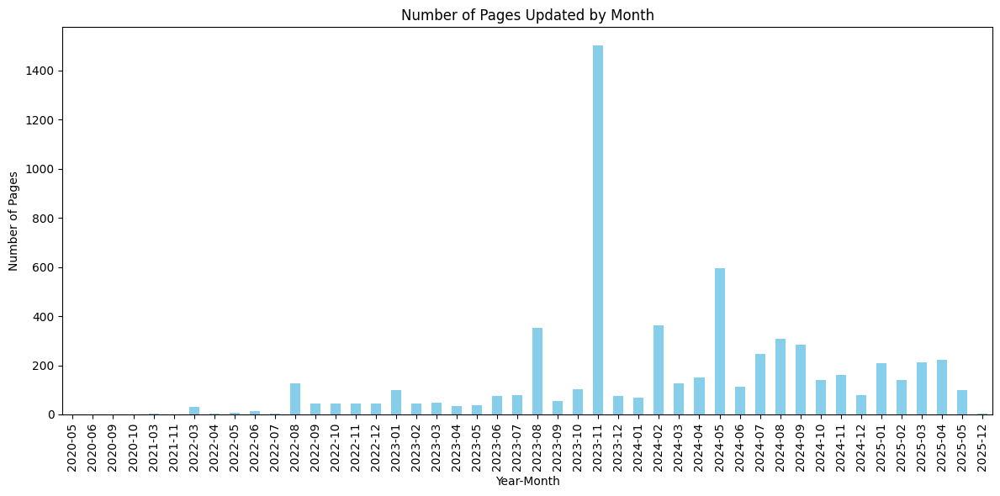

In [6]:
# Cell 3: Page Update Timeline Analysis
# ------------------------------------
# Analyze when pages were last updated

# Convert last_modified to datetime format if it exists
if 'last_modified' in df.columns:
    df['last_modified'] = pd.to_datetime(df['last_modified'], errors='coerce')
    
    # Create a year-month column for easier grouping
    df['year_month'] = df['last_modified'].dt.strftime('%Y-%m')
    
    # Analyze when pages were last updated
    print("\n--- Page Update Analysis ---")
    
    # Get the range of dates
    min_date = df['last_modified'].min()
    max_date = df['last_modified'].max()
    print(f"Oldest page update: {min_date}")
    print(f"Most recent page update: {max_date}")
    
    # Count pages updated by year-month
    monthly_updates = df['year_month'].value_counts().sort_index()
    print("\nPage updates by month:")
    print(monthly_updates)
    
    # Plot monthly updates
    plt.figure(figsize=(12, 6))
    monthly_updates.plot(kind='bar', color='skyblue')
    plt.title('Number of Pages Updated by Month')
    plt.xlabel('Year-Month')
    plt.ylabel('Number of Pages')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()



--- URL Structure Analysis ---
Number of unique domains: 1
Most common domains: {'www.natwest.com': 6380}

Top 20 first-level directories:
/business: 2252 pages
/support-centre: 1772 pages
/corporates: 1438 pages
/mortgages: 161 pages
/premier-banking: 146 pages
/life-moments: 104 pages
/learning: 84 pages
/banking-with-natwest: 68 pages
/investments: 56 pages
/current-accounts: 55 pages
/fraud-and-security: 39 pages
/savings: 32 pages
/credit-cards: 23 pages
/loans: 18 pages
/en: 15 pages
/insurance: 12 pages
/energy-at-home: 12 pages
/climate: 10 pages
/kids-and-teens-banking: 8 pages
/myrewards: 5 pages


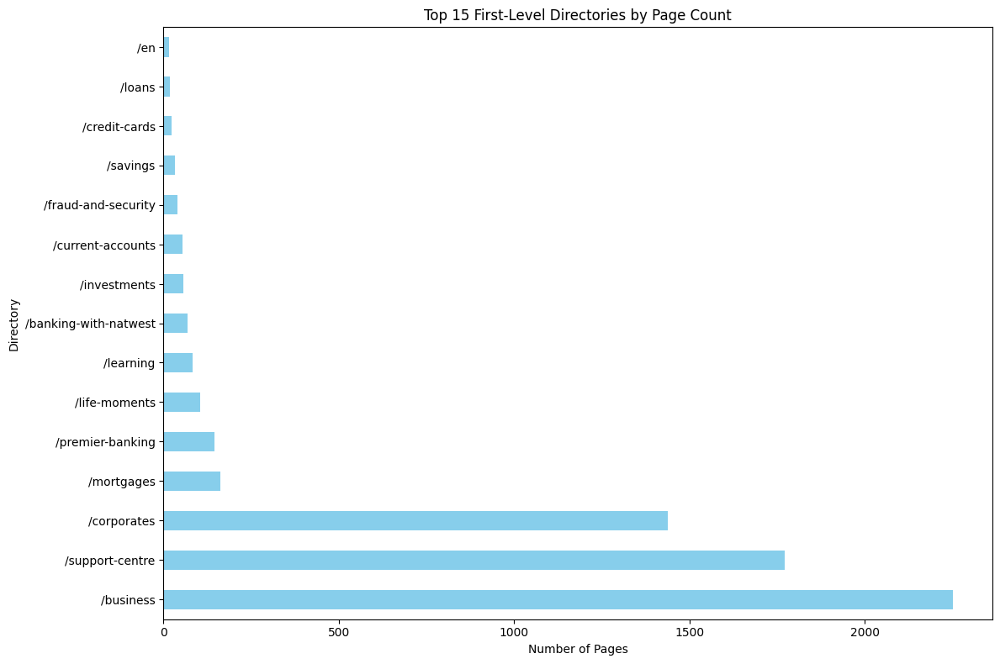


Top 5 directories contain 5769 pages (90.4% of total)


In [8]:
# Cell 4: URL Structure Analysis - Domains and Top-Level Paths
# ---------------------------------------------------------
# Analyze the domains present in the sitemap and first-level directories

# Analyze URL patterns and site structure
print("\n--- URL Structure Analysis ---")

# Extract domains
df['domain'] = df['url'].apply(lambda x: urlparse(x).netloc)
domain_counts = df['domain'].value_counts()
print(f"Number of unique domains: {len(domain_counts)}")
print(f"Most common domains: {domain_counts.head(5).to_dict()}")

# Extract and analyze the first directory level
df['first_level_path'] = df['url'].apply(lambda x: urlparse(x).path.split('/')[1] if len(urlparse(x).path.split('/')) > 1 else '/')
first_level_counts = df['first_level_path'].value_counts()

# Display the top 20 first-level directories
print("\nTop 20 first-level directories:")
for path, count in first_level_counts.head(20).items():
    # Handle empty path
    display_path = '/' if path == '' else f'/{path}'
    print(f"{display_path}: {count} pages")

# Create a horizontal bar chart of the top 15 first-level directories
plt.figure(figsize=(12, 8))
top_paths = first_level_counts.head(15)
# Replace empty string with 'Root (/)' for better chart labeling
top_paths.index = ['Root (/)' if x == '' else f'/{x}' for x in top_paths.index]
top_paths.plot(kind='barh', color='skyblue')
plt.title('Top 15 First-Level Directories by Page Count')
plt.xlabel('Number of Pages')
plt.ylabel('Directory')
plt.tight_layout()
plt.show()

# Optional: Analyze what percentage of the site is in the top 5 directories
top_5_dirs = first_level_counts.head(5).sum()
total_pages = len(df)
print(f"\nTop 5 directories contain {top_5_dirs} pages ({(top_5_dirs/total_pages)*100:.1f}% of total)")


--- Directory Updates by Month ---
year_month            2020-06  2020-09  2020-10  2022-03  2022-04  2022-05  \
first_level_path                                                             
banking-with-natwest        0        0        0        0        0        0   
business                    0        0        0        0        0        0   
corporates                  0        0        0       30        2        7   
current-accounts            0        0        0        0        0        0   
investments                 0        0        0        0        0        0   
learning                    0        0        0        0        0        0   
life-moments                0        0        0        0        0        0   
mortgages                   0        0        0        0        0        0   
premier-banking             1        1        1        0        0        0   
support-centre              0        0        0        0        0        0   

year_month            2022-

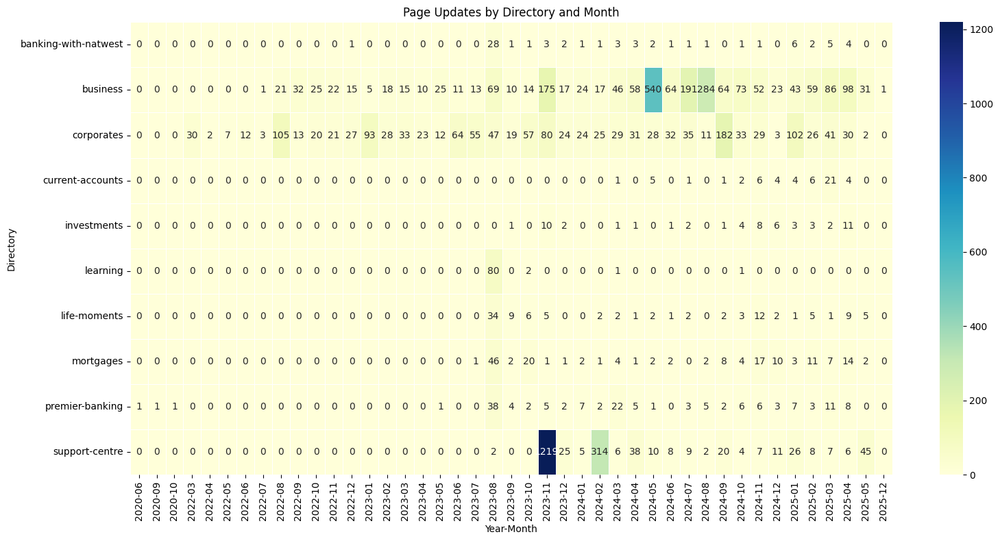

<Figure size 1600x800 with 0 Axes>

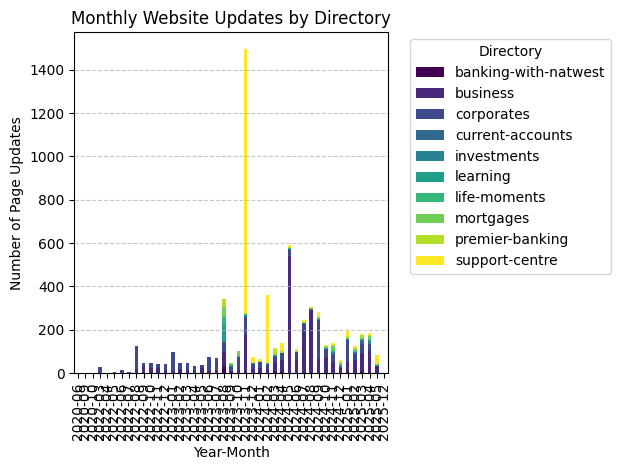

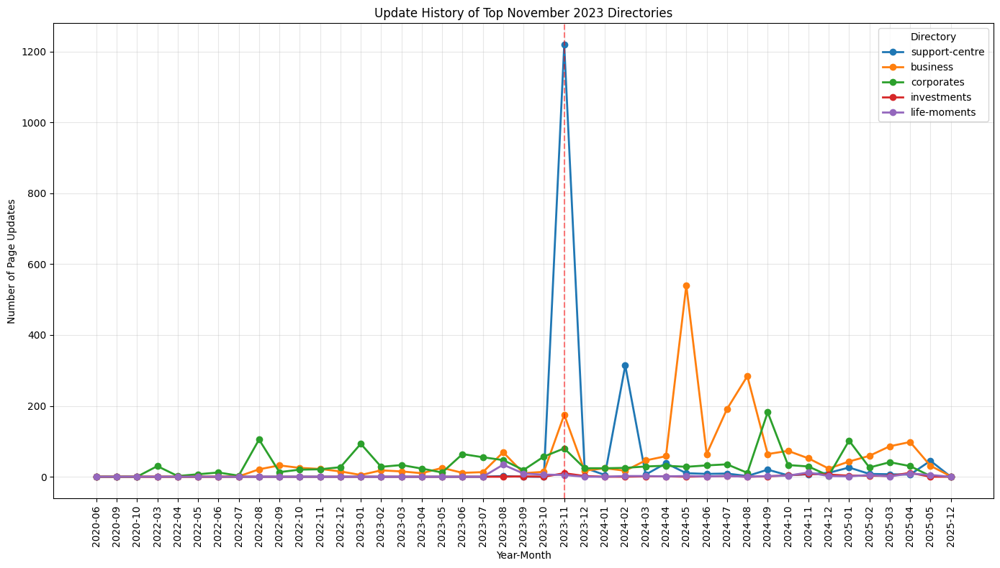

In [9]:
# Cell: Cross-Reference Directories with Update Dates
# -------------------------------------------------
# Analyze which sections of the website were updated when

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from urllib.parse import urlparse
from datetime import datetime

# Make sure last_modified is in datetime format
if 'last_modified' in df.columns:
    df['last_modified'] = pd.to_datetime(df['last_modified'], errors='coerce')
    
    # Create year-month column if not already done
    if 'year_month' not in df.columns:
        df['year_month'] = df['last_modified'].dt.strftime('%Y-%m')
    
    # Extract first-level path if not already done
    if 'first_level_path' not in df.columns:
        df['first_level_path'] = df['url'].apply(
            lambda x: urlparse(x).path.split('/')[1] if len(urlparse(x).path.split('/')) > 1 else 'root'
        )
    
    # Replace empty strings with 'root' for better display
    df['first_level_path'] = df['first_level_path'].replace('', 'root')
    
    # Get the top 10 most common first-level paths
    top_paths = df['first_level_path'].value_counts().head(10).index.tolist()
    
    # Filter to these top paths for analysis
    df_top_paths = df[df['first_level_path'].isin(top_paths)]
    
    # Create a pivot table to show updates by directory and month
    pivot = pd.pivot_table(
        df_top_paths, 
        values='url', 
        index='first_level_path',
        columns='year_month', 
        aggfunc='count',
        fill_value=0
    )
    
    # Display the pivot table
    print("\n--- Directory Updates by Month ---")
    print(pivot)
    
    # Specifically analyze November 2023
    if '2023-11' in pivot.columns:
        print("\n--- November 2023 Updates by Directory ---")
        nov_updates = pivot['2023-11'].sort_values(ascending=False)
        print(nov_updates)
        
        # Calculate percentage of total November updates for each directory
        total_nov_updates = nov_updates.sum()
        print(f"\nTotal pages updated in November 2023: {total_nov_updates}")
        print("\nPercentage of November 2023 updates by directory:")
        for dir_name, count in nov_updates.items():
            if count > 0:  # Only show directories with updates
                percentage = (count / total_nov_updates) * 100
                print(f"{dir_name}: {count} pages ({percentage:.1f}%)")
    
    # Create a heatmap visualization of the update patterns
    plt.figure(figsize=(16, 8))
    sns.heatmap(pivot, cmap="YlGnBu", annot=True, fmt="d", linewidths=.5)
    plt.title('Page Updates by Directory and Month')
    plt.ylabel('Directory')
    plt.xlabel('Year-Month')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
    
    # Create a stacked bar chart to show monthly distribution of updates by directory
    pivot_transposed = pivot.transpose()
    
    plt.figure(figsize=(16, 8))
    pivot_transposed.plot(kind='bar', stacked=True, colormap='viridis')
    plt.title('Monthly Website Updates by Directory')
    plt.xlabel('Year-Month')
    plt.ylabel('Number of Page Updates')
    plt.legend(title='Directory', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    # Focus on specific directories over time (line chart)
    # Find the top 5 directories with the most updates in November 2023
    top_nov_dirs = []
    if '2023-11' in pivot.columns:
        top_nov_dirs = pivot['2023-11'].nlargest(5).index.tolist()
    
    if top_nov_dirs:
        plt.figure(figsize=(14, 8))
        for dir_name in top_nov_dirs:
            plt.plot(pivot.columns, pivot.loc[dir_name], marker='o', linewidth=2, label=dir_name)
        
        plt.title('Update History of Top November 2023 Directories')
        plt.xlabel('Year-Month')
        plt.ylabel('Number of Page Updates')
        plt.xticks(rotation=90)
        plt.legend(title='Directory')
        plt.grid(True, alpha=0.3)
        
        # Highlight November 2023
        if '2023-11' in pivot.columns:
            nov_index = list(pivot.columns).index('2023-11')
            plt.axvline(x=nov_index, color='r', linestyle='--', alpha=0.5, label='November 2023')
        
        plt.tight_layout()
        plt.show()
else:
    print("No 'last_modified' column found in the data. Cannot perform update analysis.")


URL Depth Statistics:
count    6380.000000
mean        4.167712
std         0.862970
min         0.000000
25%         4.000000
50%         4.000000
75%         5.000000
max         6.000000
Name: depth, dtype: float64


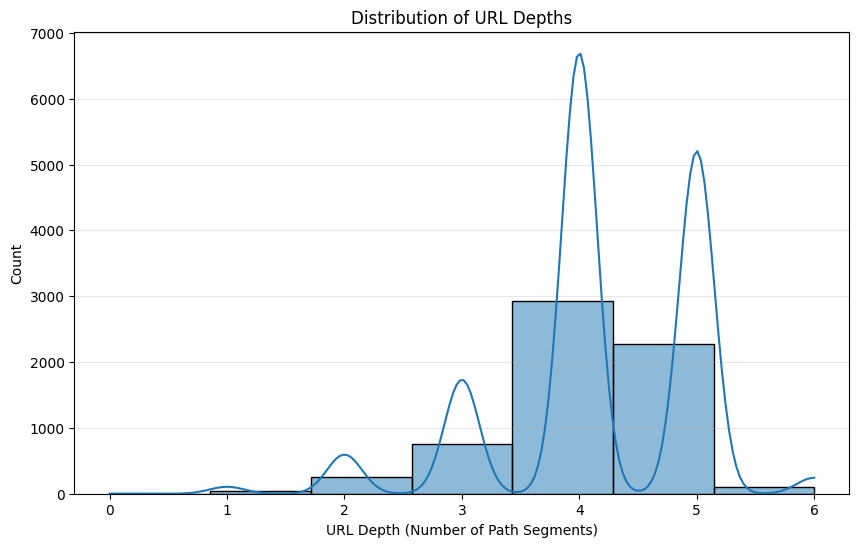

In [11]:
# Cell 5: URL Structure Analysis - Depth
# -------------------------------------
# Analyze the depth of URLs (number of path segments)

# Extract URL depths (number of path segments)
df['path'] = df['url'].apply(lambda x: urlparse(x).path)
df['depth'] = df['path'].apply(lambda x: len([p for p in x.split('/') if p]))

# Display depth statistics
print("\nURL Depth Statistics:")
print(df['depth'].describe())

# Plot URL depth distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['depth'], bins=max(df['depth'])+1, kde=True)
plt.title('Distribution of URL Depths')
plt.xlabel('URL Depth (Number of Path Segments)')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.3)
plt.xticks(range(max(df['depth'])+1))
plt.show()


Top 10 website sections:
top_section
business                2252
support-centre          1772
corporates              1438
mortgages                161
premier-banking          146
life-moments             104
learning                  84
banking-with-natwest      68
investments               56
current-accounts          55
Name: count, dtype: int64


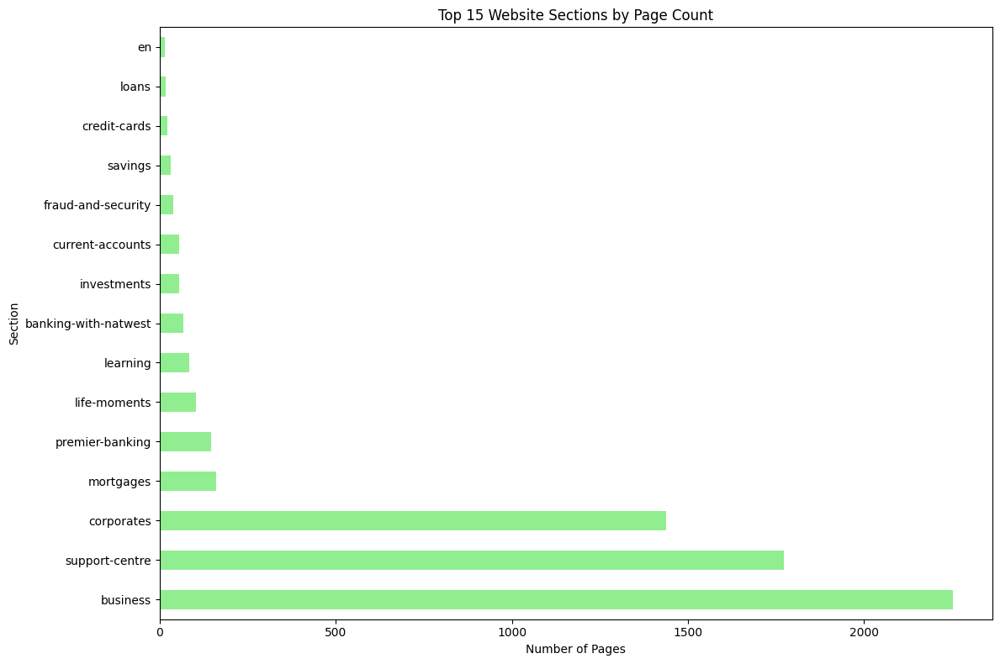

In [12]:
# Cell 6: Website Sections Analysis
# --------------------------------
# Analyze the top-level sections of the website

# Extract top-level sections of the website
df['top_section'] = df['path'].apply(lambda x: x.split('/')[1] if len(x.split('/')) > 1 else 'root')
top_sections = df['top_section'].value_counts()

# Print the top 10 sections
print("\nTop 10 website sections:")
print(top_sections.head(10))

# Plot top-level sections
plt.figure(figsize=(12, 8))
top_sections.head(15).plot(kind='barh', color='lightgreen')
plt.title('Top 15 Website Sections by Page Count')
plt.xlabel('Number of Pages')
plt.ylabel('Section')
plt.tight_layout()
plt.show()

In [13]:
# Cell 7: Network Visualization Function
# ------------------------------------
# Define function to create a visual sitemap using NetworkX

def create_network_visualization(dataframe, max_depth=3, max_nodes=100):
    """
    Create a network visualization of the site structure
    
    Args:
        dataframe: DataFrame containing the URLs
        max_depth: Maximum URL depth to include
        max_nodes: Maximum number of nodes to display
    """
    # Filter by depth to avoid too complex visualization
    filtered_df = dataframe[dataframe['depth'] <= max_depth].head(max_nodes)
    
    # Create a graph
    G = nx.DiGraph()
    
    # Add the domain as the root node
    root_domain = filtered_df['domain'].iloc[0]
    G.add_node(root_domain, size=20, color='red')
    
    # Add nodes and edges for each URL
    for index, row in filtered_df.iterrows():
        url_parts = [p for p in row['path'].split('/') if p]
        
        # Skip empty paths
        if not url_parts:
            continue
            
        # Build the path incrementally
        current_path = root_domain
        for i, part in enumerate(url_parts):
            # Create a node name for this level
            if i == 0:
                node_name = f"/{part}"
            else:
                node_name = f"{current_path}/{part}"
                
            # Add the node if it doesn't exist
            if not G.has_node(node_name):
                # Size based on depth (smaller as we go deeper)
                size = max(5, 15 - (i * 3))
                G.add_node(node_name, size=size, color='blue')
            
            # Add edge from parent to this node
            G.add_edge(current_path, node_name)
            
            # Update current path for next iteration
            current_path = node_name
    
    # Plot the graph
    plt.figure(figsize=(15, 15))
    
    # Define node positions using spring layout
    pos = nx.spring_layout(G, k=0.15, iterations=50)
    
    # Extract node sizes and colors
    node_sizes = [G.nodes[n]['size']*100 for n in G.nodes()]
    node_colors = [G.nodes[n]['color'] for n in G.nodes()]
    
    # Draw the network
    nx.draw_networkx(
        G, pos, 
        with_labels=True,
        node_size=node_sizes,
        node_color=node_colors,
        font_size=8,
        alpha=0.8,
        arrows=True,
        connectionstyle='arc3,rad=0.1'
    )
    
    plt.title(f'Website Structure Visualization (Max Depth: {max_depth}, Max Nodes: {max_nodes})')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return G

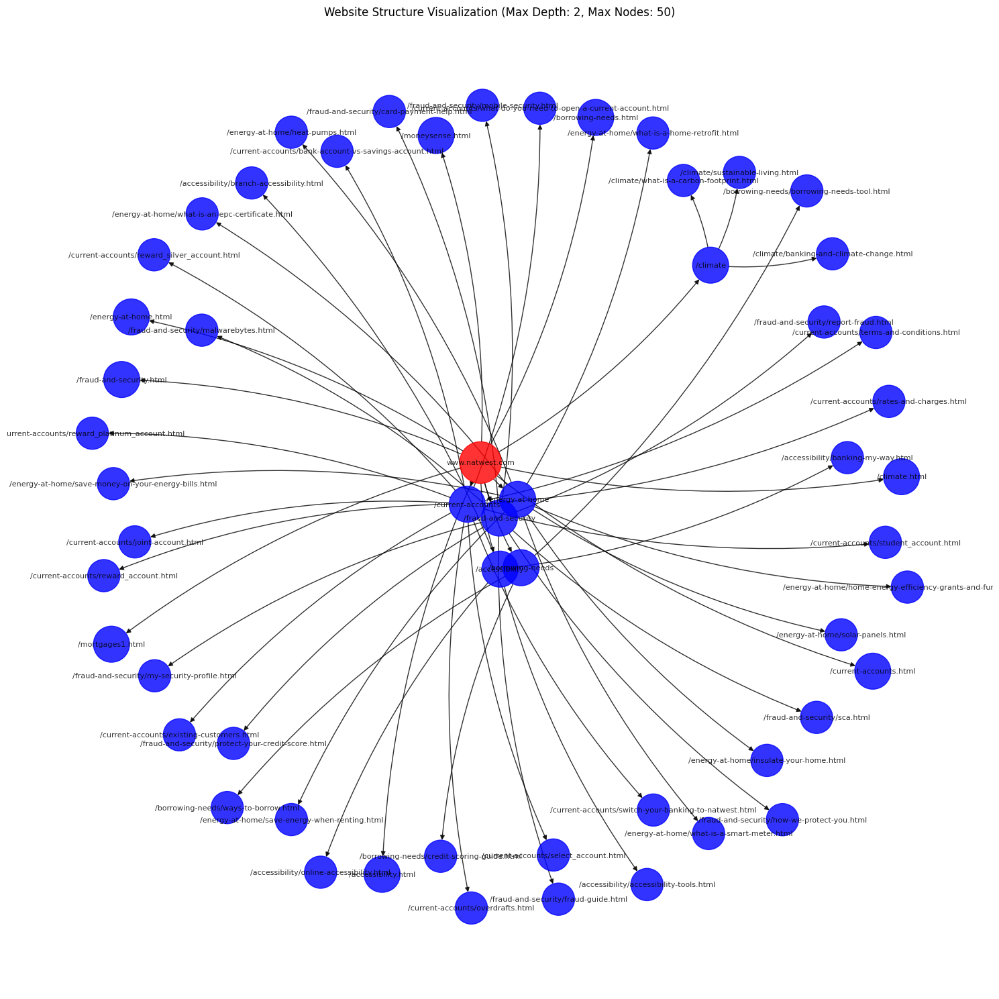

In [14]:
# Cell 8: Create Network Visualization
# ----------------------------------
# Generate the network visualization with the defined function

# Create and display network visualization
# Adjust max_depth and max_nodes as needed for your dataset size
G = create_network_visualization(df, max_depth=2, max_nodes=50)

# Cell 9: Interactive Tree Visualization Function
# --------------------------------------------
# Define function to create an interactive tree visualization using Plotly

def create_interactive_tree(dataframe, max_depth=3, max_nodes=100):
    """
    Create an interactive tree visualization using Plotly
    
    Args:
        dataframe: DataFrame containing the URLs
        max_depth: Maximum URL depth to include
        max_nodes: Maximum number of nodes to display
    """
    # Filter by depth
    filtered_df = dataframe[dataframe['depth'] <= max_depth].head(max_nodes)
    
    # Create a dictionary to represent the tree
    tree = defaultdict(list)
    
    # Root domain
    root_domain = filtered_df['domain'].iloc[0]
    
    for index, row in filtered_df.iterrows():
        url_parts = [p for p in row['path'].split('/') if p]
        
        if not url_parts:
            # Root URL
            tree[root_domain].append('/')
        else:
            # Add paths to tree
            parent = root_domain
            full_path = ""
            
            for i, part in enumerate(url_parts):
                if i == 0:
                    child = f"/{part}"
                    if child not in tree[parent]:
                        tree[parent].append(child)
                    parent = child
                    full_path = child
                else:
                    child = f"{full_path}/{part}"
                    if child not in tree[parent]:
                        tree[parent].append(child)
                    parent = child
                    full_path = child
    
    # Build lists for Plotly sunburst chart
    labels = [root_domain]
    parents = [""]
    values = [100]  # Root value
    
    # Add all tree nodes
    for parent, children in tree.items():
        for child in children:
            labels.append(child)
            parents.append(parent)
            values.append(30)  # Default value
    
    # Create sunburst chart
    fig = go.Figure(go.Sunburst(
        labels=labels,
        parents=parents,
        values=values,
        branchvalues="total",
        maxdepth=3,
    ))
    
    fig.update_layout(
        title=f"Interactive Website Structure (Max Depth: {max_depth}, Max Nodes: {max_nodes})",
        width=950,
        height=950,
    )
    
    return fig

In [15]:
# Cell 10: Create Interactive Tree Visualization
# -------------------------------------------
# Generate the interactive tree visualization

# Create interactive visualization
# This will display in the notebook if you have Plotly installed
interactive_tree = create_interactive_tree(df, max_depth=3, max_nodes=100)
interactive_tree.show()


Content type distribution:
content_type
HTML     6379
Other       1
Name: count, dtype: int64


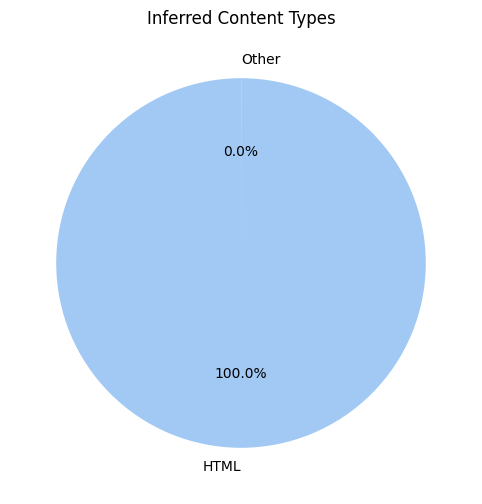

In [16]:
# Cell 11: Content Type Analysis
# ----------------------------
# Analyze content types based on URL patterns

# Function to infer content type from URL patterns
def infer_content_type(url):
    """Infer the content type from URL patterns"""
    if re.search(r'\.(html|htm)$', url):
        return 'HTML'
    elif re.search(r'\.(pdf)$', url):
        return 'PDF'
    elif re.search(r'\.(jpg|jpeg|png|gif|svg)$', url):
        return 'Image'
    elif re.search(r'\.(css|js)$', url):
        return 'Asset'
    elif '/blog/' in url or '/news/' in url or '/article/' in url:
        return 'Article'
    elif '/product/' in url or '/shop/' in url or '/item/' in url:
        return 'Product'
    else:
        return 'Other'

# Apply content type inference
df['content_type'] = df['url'].apply(infer_content_type)

# Display content type counts
content_counts = df['content_type'].value_counts()
print("\nContent type distribution:")
print(content_counts)

# Plot content type distribution
plt.figure(figsize=(10, 6))
content_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Inferred Content Types')
plt.ylabel('')
plt.show()


Priority statistics:
count    6380.000000
mean        0.630846
std         0.107655
min         0.000000
25%         0.600000
50%         0.600000
75%         0.700000
max         1.000000
Name: priority, dtype: float64


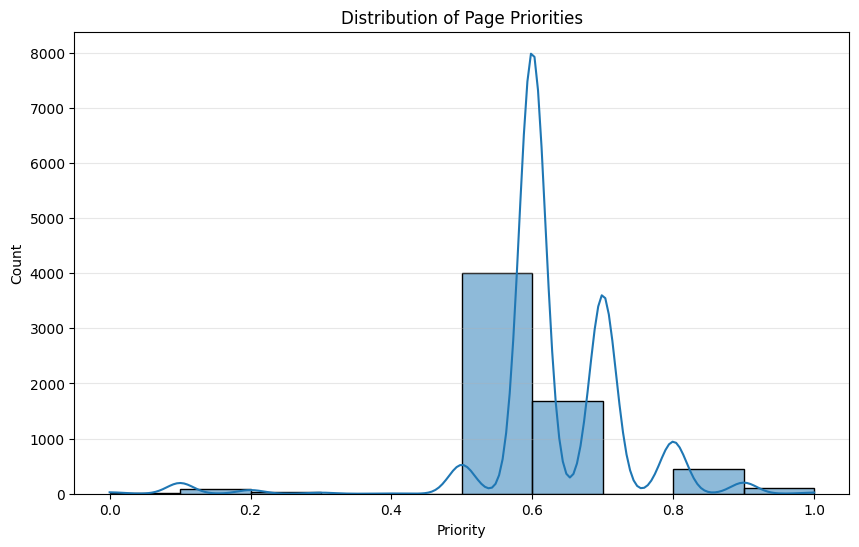

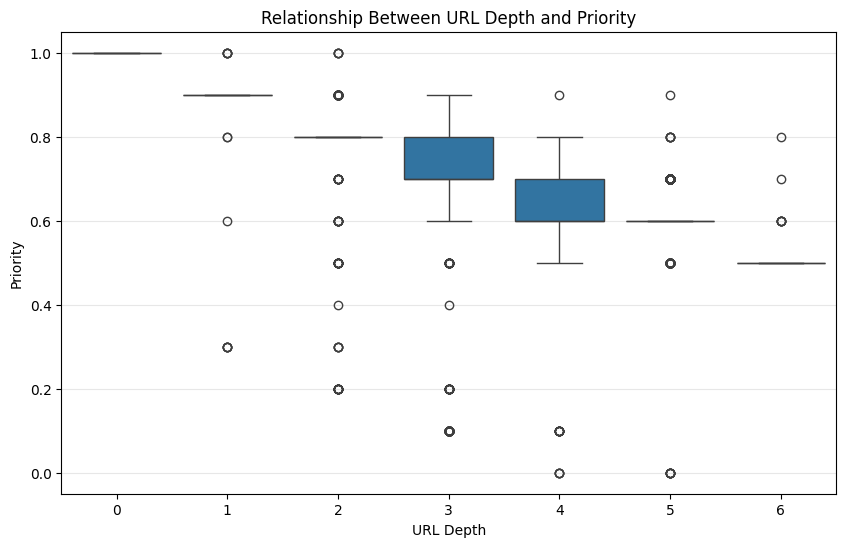

In [18]:
# Cell 12: Priority Analysis
# ------------------------
# Analyze page priorities if they exist in the data

# If priority exists, analyze it
if 'priority' in df.columns:
    # Convert to numeric if not already
    df['priority'] = pd.to_numeric(df['priority'], errors='coerce')
    
    # Basic priority statistics
    print("\nPriority statistics:")
    print(df['priority'].describe())
    
    # Analyze priority distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(df['priority'].dropna(), bins=10, kde=True)
    plt.title('Distribution of Page Priorities')
    plt.xlabel('Priority')
    plt.ylabel('Count')
    plt.grid(axis='y', alpha=0.3)
    plt.show()
    
     # Check if there's a relationship between depth and priority
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='depth', y='priority', data=df)
    plt.title('Relationship Between URL Depth and Priority')
    plt.xlabel('URL Depth')
    plt.ylabel('Priority')
    plt.grid(axis='y', alpha=0.3)
    plt.show()


--- Support Centre Pages Analysis ---
Total support centre pages identified: 1862
Percentage of total site: 29.18%

Support Centre update timeline:
year_month
2023-08       2
2023-11    1229
2023-12      26
2024-01       5
2024-02     315
2024-03      21
2024-04      40
2024-05      11
2024-06      17
2024-07      11
2024-08       4
2024-09      27
2024-10       9
2024-11       9
2024-12      12
2025-01      28
2025-02      18
2025-03      17
2025-04      15
2025-05      46
Name: count, dtype: int64


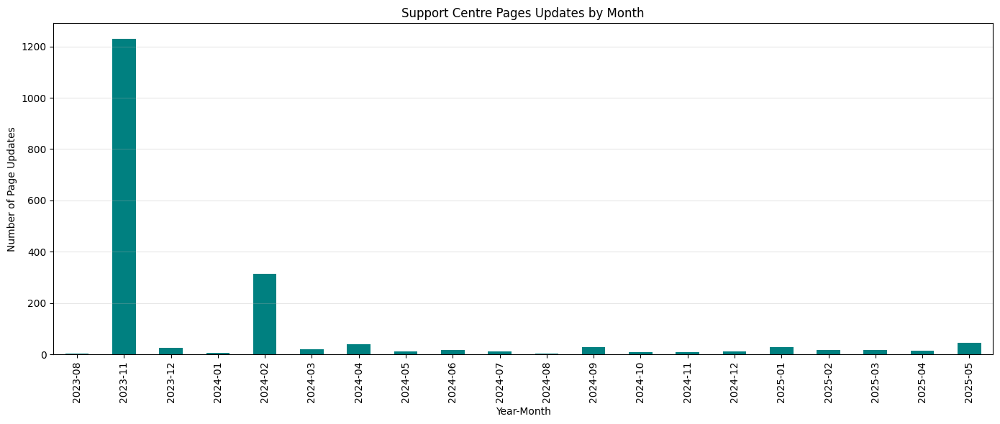


November 2023 updates: 1229 pages (66.00% of all support pages)

Top support centre categories:
third_level
general                          1308
how-to-use-the-mobile-app          68
rooster-money                      37
make-payments                      35
current-accounts                   34
making-and-accepting-payments      21
login-help                         19
card-reader                        16
transactions                       15
general-banking-information        13
how-to-use-ebanking                12
update-details                     12
find-account-details               12
cheques                            11
credit-card                        11
Name: count, dtype: int64


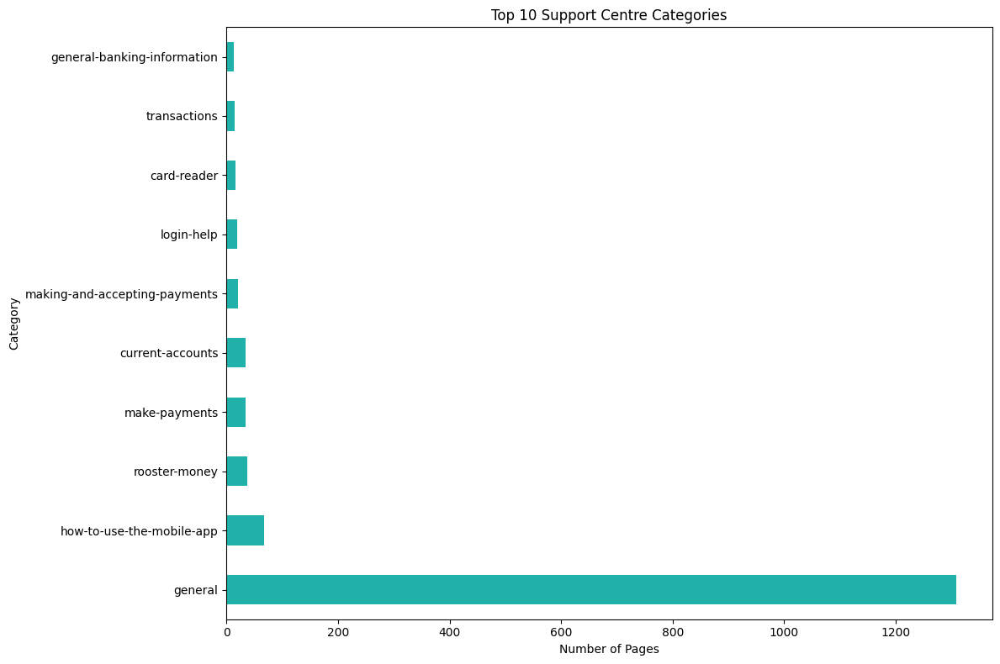

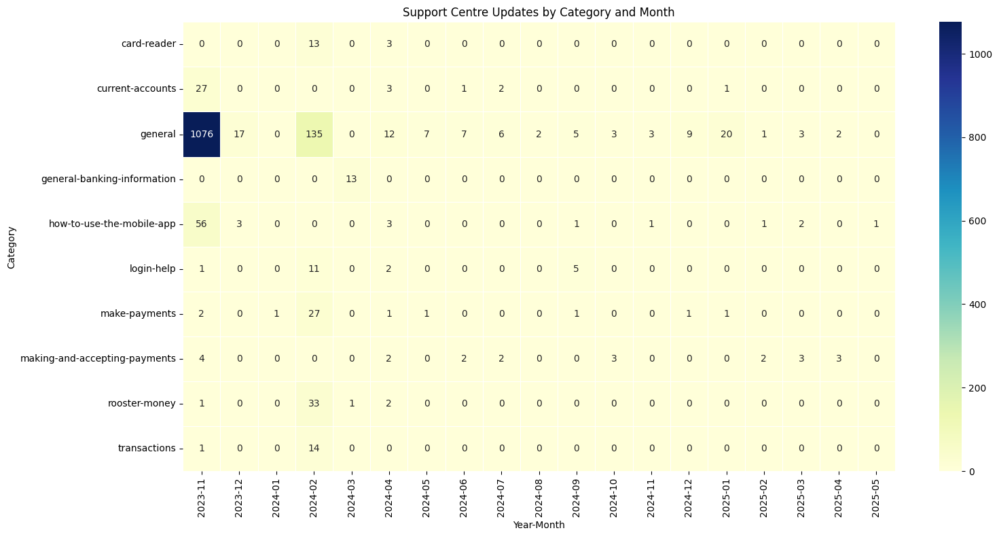


November 2023 Support Centre updates by category:
general: 1076 pages
how-to-use-the-mobile-app: 56 pages
current-accounts: 27 pages
mortgage: 10 pages
credit-card: 9 pages
cheques: 8 pages
savings: 7 pages
how-to-use-ebanking: 7 pages
loan: 6 pages
making-and-accepting-payments: 4 pages
overdraft: 3 pages
make-payments: 2 pages
private-banking: 2 pages
foreign-currency: 1 pages
savings-support: 1 pages
savings-support.html: 1 pages
contact-us: 1 pages
rooster-money: 1 pages
interest-rates.html: 1 pages
business-account: 1 pages
login-help: 1 pages
brexit-hub: 1 pages
interest-rates: 1 pages
transactions: 1 pages
card-functionality: 1 pages


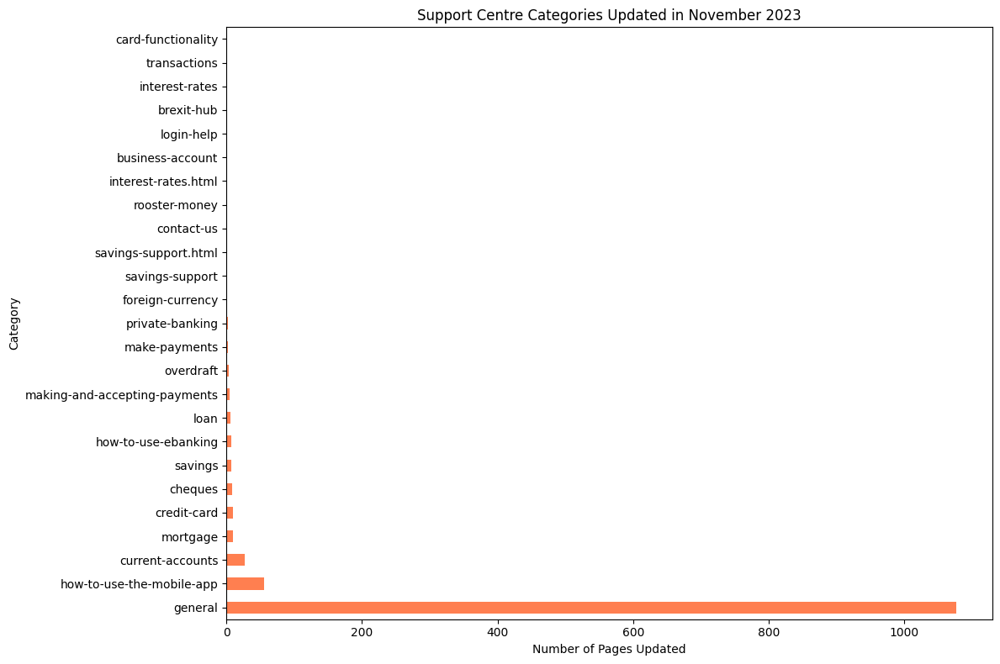

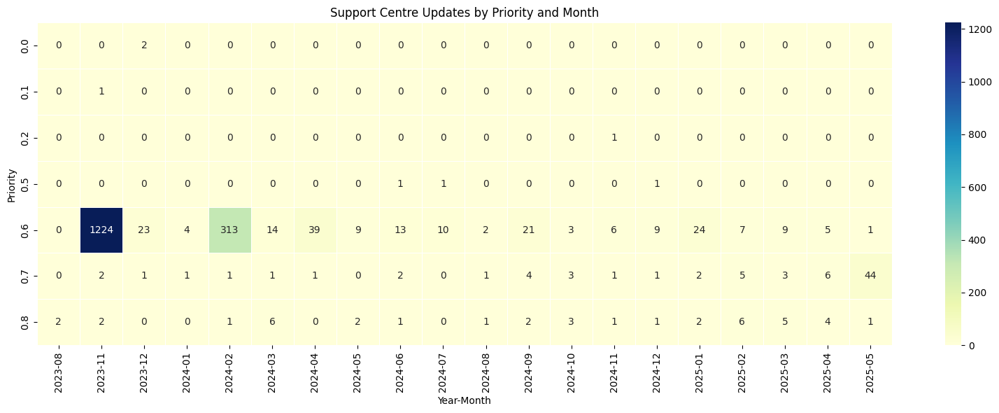

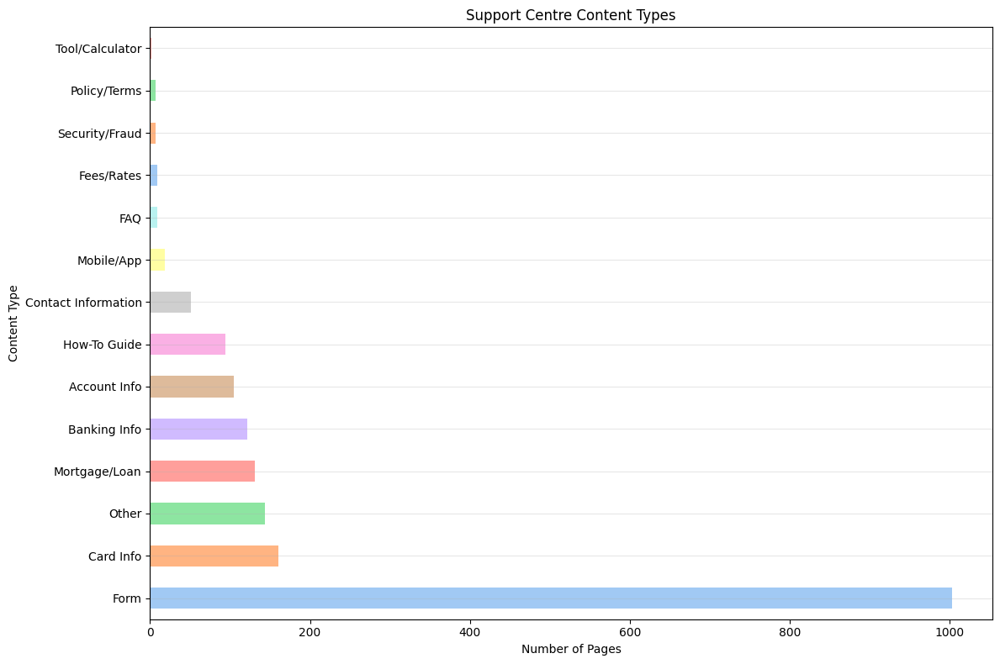

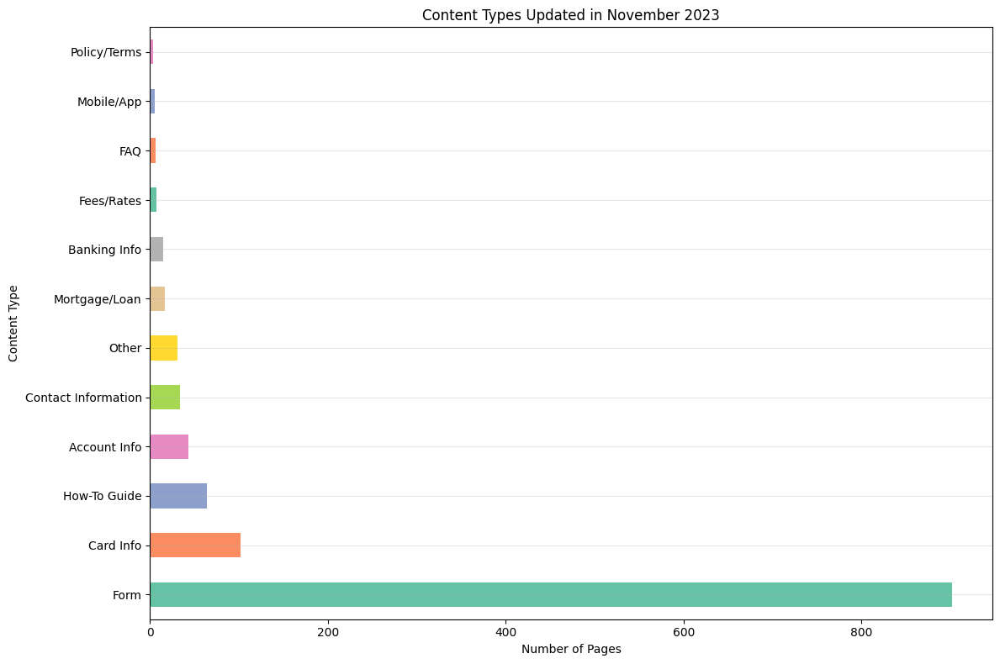


November 2023 support updates by content type:
Form: 902 pages
Card Info: 102 pages
How-To Guide: 64 pages
Account Info: 43 pages
Contact Information: 34 pages
Other: 31 pages
Mortgage/Loan: 17 pages
Banking Info: 15 pages
Fees/Rates: 7 pages
FAQ: 6 pages
Mobile/App: 5 pages
Policy/Terms: 3 pages

Percentage of monthly updates that were support pages:
year_month
2020-05     0.0
2020-06     0.0
2020-09     0.0
2020-10     0.0
2021-03     0.0
2021-11     0.0
2022-03     0.0
2022-04     0.0
2022-05     0.0
2022-06     0.0
2022-07     0.0
2022-08     0.0
2022-09     0.0
2022-10     0.0
2022-11     0.0
2022-12     0.0
2023-01     0.0
2023-02     0.0
2023-03     0.0
2023-04     0.0
2023-05     0.0
2023-06     0.0
2023-07     0.0
2023-08     0.6
2023-09     0.0
2023-10     0.0
2023-11    81.9
2023-12    35.1
2024-01     7.2
2024-02    87.0
2024-03    16.8
2024-04    26.8
2024-05     1.8
2024-06    15.2
2024-07     4.5
2024-08     1.3
2024-09     9.5
2024-10     6.4
2024-11     5.6
2024-12   

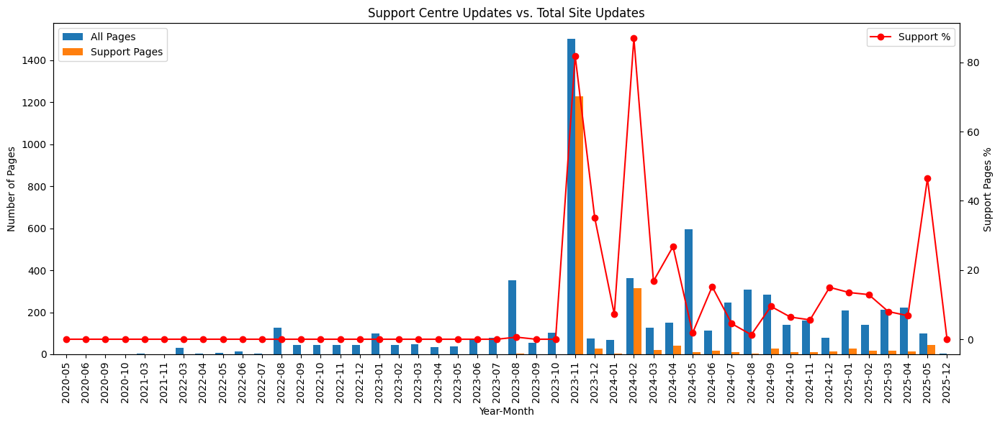


November 2023 comparison:
Total site updates: 1501
Support centre updates: 1229.0
Support pages as percentage: 81.9%


In [20]:
# Cell: Deep Dive Analysis of Support Centre Pages (with Bar Charts)
# ---------------------------------------------------------------
# Analyze the structure, content, and update patterns of pages under /support-centre/

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from urllib.parse import urlparse
import re
from datetime import datetime
import numpy as np

# Step 1: Identify support centre pages
support_df = df[df['url'].str.contains('/support-centre/', case=False)].copy()

# Report basic statistics
print(f"\n--- Support Centre Pages Analysis ---")
print(f"Total support centre pages identified: {len(support_df)}")
print(f"Percentage of total site: {len(support_df) / len(df) * 100:.2f}%")

# Step 2: Analyze update patterns
if 'last_modified' in support_df.columns:
    # Ensure last_modified is in datetime format
    support_df['last_modified'] = pd.to_datetime(support_df['last_modified'], errors='coerce')
    
    # Create year-month column if not already present
    if 'year_month' not in support_df.columns:
        support_df['year_month'] = support_df['last_modified'].dt.strftime('%Y-%m')
    
    # Get update timeline
    monthly_updates = support_df['year_month'].value_counts().sort_index()
    
    print("\nSupport Centre update timeline:")
    print(monthly_updates)
    
    # Visualize update timeline
    plt.figure(figsize=(14, 6))
    monthly_updates.plot(kind='bar', color='teal')
    plt.title('Support Centre Pages Updates by Month')
    plt.xlabel('Year-Month')
    plt.ylabel('Number of Page Updates')
    plt.xticks(rotation=90)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Highlight November 2023 if present
    if '2023-11' in monthly_updates.index:
        nov_updates = monthly_updates.get('2023-11', 0)
        total_updates = len(support_df)
        print(f"\nNovember 2023 updates: {nov_updates} pages ({nov_updates/total_updates*100:.2f}% of all support pages)")

# Step 3: Extract and analyze second-level paths in support centre
support_df['path_parts'] = support_df['url'].apply(lambda x: [p for p in urlparse(x).path.split('/') if p])
support_df['second_level'] = support_df['path_parts'].apply(lambda x: x[1] if len(x) > 1 else None)
support_df['third_level'] = support_df['path_parts'].apply(lambda x: x[2] if len(x) > 2 else None)

# Count second-level categories
second_level_counts = support_df['third_level'].value_counts()
print("\nTop support centre categories:")
print(second_level_counts.head(15))

# Visualize second-level categories
plt.figure(figsize=(12, 8))
second_level_counts.head(10).plot(kind='barh', color='lightseagreen')
plt.title('Top 10 Support Centre Categories')
plt.xlabel('Number of Pages')
plt.ylabel('Category')
plt.tight_layout()
plt.show()

# Step 4: Cross-reference second-level categories with update months
if 'last_modified' in support_df.columns and 'year_month' in support_df.columns:
    # Create pivot table for categories by month
    pivot = pd.pivot_table(
        support_df, 
        values='url', 
        index='third_level',
        columns='year_month', 
        aggfunc='count',
        fill_value=0
    )
    
    # Filter to top categories
    top_categories = second_level_counts.head(10).index.tolist()
    pivot_filtered = pivot.loc[pivot.index.isin(top_categories)]
    
    # Heatmap of updates by category and month
    plt.figure(figsize=(16, 8))
    sns.heatmap(pivot_filtered, cmap="YlGnBu", annot=True, fmt="d", linewidths=.5)
    plt.title('Support Centre Updates by Category and Month')
    plt.ylabel('Category')
    plt.xlabel('Year-Month')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
    
    # If November 2023 is present, analyze which categories were updated then
    if '2023-11' in pivot.columns:
        print("\nNovember 2023 Support Centre updates by category:")
        nov_updates = pivot['2023-11'].sort_values(ascending=False)
        for category, count in nov_updates.items():
            if count > 0:  # Only show categories with updates
                print(f"{category}: {count} pages")
                
        # Visualize November 2023 updates by category
        plt.figure(figsize=(12, 8))
        nov_updates[nov_updates > 0].plot(kind='barh', color='coral')
        plt.title('Support Centre Categories Updated in November 2023')
        plt.xlabel('Number of Pages Updated')
        plt.ylabel('Category')
        plt.tight_layout()
        plt.show()

# Step 5: Analyze update patterns by priority (if priority column exists)
if 'priority' in support_df.columns:
    # Convert to numeric if needed
    support_df['priority'] = pd.to_numeric(support_df['priority'], errors='coerce')
    
    # Check if certain priority pages were updated more frequently
    if 'year_month' in support_df.columns:
        # Group by priority and update month
        priority_updates = support_df.groupby(['priority', 'year_month']).size().unstack(fill_value=0)
        
        # Heatmap of updates by priority and month
        plt.figure(figsize=(16, 6))
        sns.heatmap(priority_updates, cmap="YlGnBu", annot=True, fmt="d", linewidths=.5)
        plt.title('Support Centre Updates by Priority and Month')
        plt.ylabel('Priority')
        plt.xlabel('Year-Month')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

# Step 6: Analyze URL patterns to infer content types
def infer_support_content_type(url):
    """Infer the content type from URL patterns in support centre"""
    url_lower = url.lower()
    
    if 'faq' in url_lower or 'question' in url_lower:
        return 'FAQ'
    elif 'contact' in url_lower:
        return 'Contact Information'
    elif 'how-to' in url_lower or 'guide' in url_lower or 'tutorial' in url_lower:
        return 'How-To Guide'
    elif 'form' in url_lower:
        return 'Form'
    elif 'tool' in url_lower or 'calculator' in url_lower:
        return 'Tool/Calculator'
    elif 'policy' in url_lower or 'term' in url_lower:
        return 'Policy/Terms'
    elif 'security' in url_lower or 'fraud' in url_lower or 'scam' in url_lower:
        return 'Security/Fraud'
    elif 'banking' in url_lower:
        return 'Banking Info'
    elif 'account' in url_lower:
        return 'Account Info'
    elif 'card' in url_lower:
        return 'Card Info'
    elif 'mortgage' in url_lower or 'loan' in url_lower:
        return 'Mortgage/Loan'
    elif 'app' in url_lower or 'mobile' in url_lower:
        return 'Mobile/App'
    elif 'fee' in url_lower or 'charge' in url_lower or 'rate' in url_lower:
        return 'Fees/Rates'
    else:
        return 'Other'

# Apply content type inference
support_df['content_type'] = support_df['url'].apply(infer_support_content_type)

# Visualize content type distribution (BAR CHART INSTEAD OF PIE CHART)
content_counts = support_df['content_type'].value_counts()
plt.figure(figsize=(12, 8))
content_counts.plot(kind='barh', color=sns.color_palette('pastel'))
plt.title('Support Centre Content Types')
plt.xlabel('Number of Pages')
plt.ylabel('Content Type')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# If November 2023 is of interest, analyze content types updated then
if 'year_month' in support_df.columns:
    nov_support = support_df[support_df['year_month'] == '2023-11']
    if len(nov_support) > 0:
        nov_content_counts = nov_support['content_type'].value_counts()
        
        # BAR CHART INSTEAD OF PIE CHART
        plt.figure(figsize=(12, 8))
        nov_content_counts.plot(kind='barh', color=sns.color_palette('Set2'))
        plt.title('Content Types Updated in November 2023')
        plt.xlabel('Number of Pages')
        plt.ylabel('Content Type')
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        print("\nNovember 2023 support updates by content type:")
        for content_type, count in nov_content_counts.items():
            print(f"{content_type}: {count} pages")

# Step 7: Additional analysis - compare support centre update pattern with overall site
if 'year_month' in df.columns and 'year_month' in support_df.columns:
    # Calculate percentage of updates that were support pages each month
    monthly_all = df['year_month'].value_counts().sort_index()
    monthly_support = support_df['year_month'].value_counts().sort_index()
    
    # Align the indices
    combined = pd.DataFrame({
        'all_pages': monthly_all,
        'support_pages': monthly_support
    }).fillna(0)
    
    # Calculate percentage
    combined['support_percentage'] = (combined['support_pages'] / combined['all_pages'] * 100).round(1)
    
    print("\nPercentage of monthly updates that were support pages:")
    print(combined['support_percentage'])
    
    # Visualize this trend
    plt.figure(figsize=(14, 6))
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    
    combined[['all_pages', 'support_pages']].plot(kind='bar', ax=ax1, width=0.8)
    combined['support_percentage'].plot(kind='line', marker='o', color='red', ax=ax2)
    
    ax1.set_title('Support Centre Updates vs. Total Site Updates')
    ax1.set_xlabel('Year-Month')
    ax1.set_ylabel('Number of Pages')
    ax2.set_ylabel('Support Pages %')
    ax1.legend(['All Pages', 'Support Pages'], loc='upper left')
    ax2.legend(['Support %'], loc='upper right')
    
    plt.grid(False)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
    
    # If November 2023 shows a spike, check if it was uniform across the site
    if '2023-11' in combined.index:
        print(f"\nNovember 2023 comparison:")
        print(f"Total site updates: {combined.loc['2023-11', 'all_pages']}")
        print(f"Support centre updates: {combined.loc['2023-11', 'support_pages']}")
        print(f"Support pages as percentage: {combined.loc['2023-11', 'support_percentage']}%")